# **Python Cognitive Computer Vision**
---

## **Computer Vision Image Analysis**
- with Microsoft Azure and Microsoft Cognitive Services
---

![실습에 사용할 개와 고양이 이미지](https://storage.googleapis.com/petbacker/images/blog/2017/dog-and-cat-cover.jpg)

In [20]:
import requests
from io import BytesIO
from PIL import Image

In [21]:
image_url = 'https://storage.googleapis.com/petbacker/images/blog/2017/dog-and-cat-cover.jpg'
response = requests.get(image_url)    
response  # 이미지 불러오기 (200번대가 뜨면 성공, 400번/500번대가 뜨면 서버에서 거부한 것이다.)

<Response [200]>

In [22]:
response.content    # 이미지에 해당되는 코드 출력 (맨 앞의 x 표시는 이 파일이 바이너리 파일임을 나타낸다. (16진수) -> 텍스트 파일이 아니다.)

b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00\x84\x00\x0b\x08\x08\n\x08\x07\x0b\n\t\n\r\x0c\x0b\r\x11\x1c\x12\x11\x0f\x0f\x11"\x19\x1a\x14\x1c)$+*($\'\'-2@7-0=0\'\'8L9=CEHIH+6OUNFT@GHE\x01\x0c\r\r\x11\x0f\x11!\x12\x12!E.\'.EEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEEE\xff\xc0\x00\x11\x08\x02v\x04\xb0\x03\x01\x11\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x01\xa2\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca\xd2\xd3\xd4\xd5\xd6\xd7\xd8\xd9\xda\xe1\xe2\xe3\xe4\xe5\xe6\xe7\xe8\xe9\xe

In [23]:
# 이미지를 표시하기 위해 바이트 단위로 재조립한다.
img = BytesIO(response.content)
img

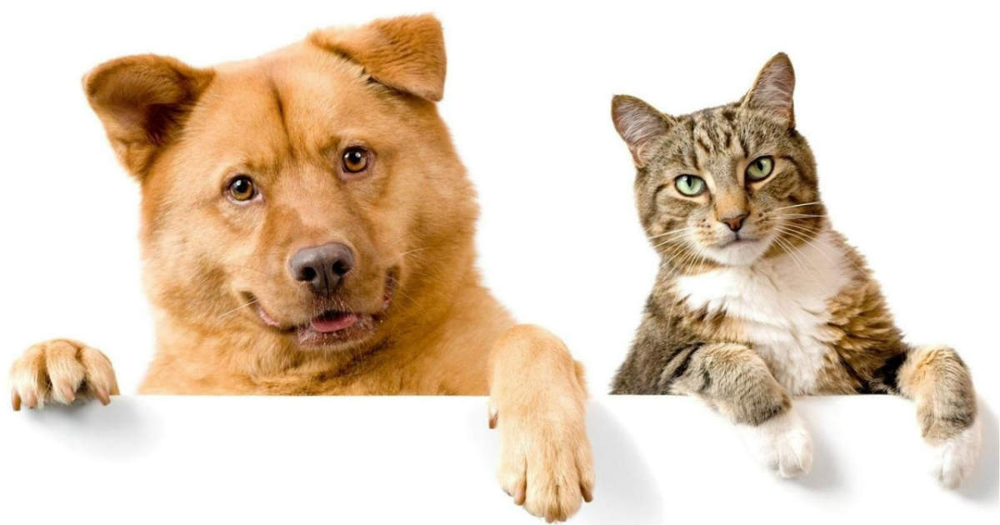

In [25]:
# 이미지를 표시한다.
image = Image.open(img)
image

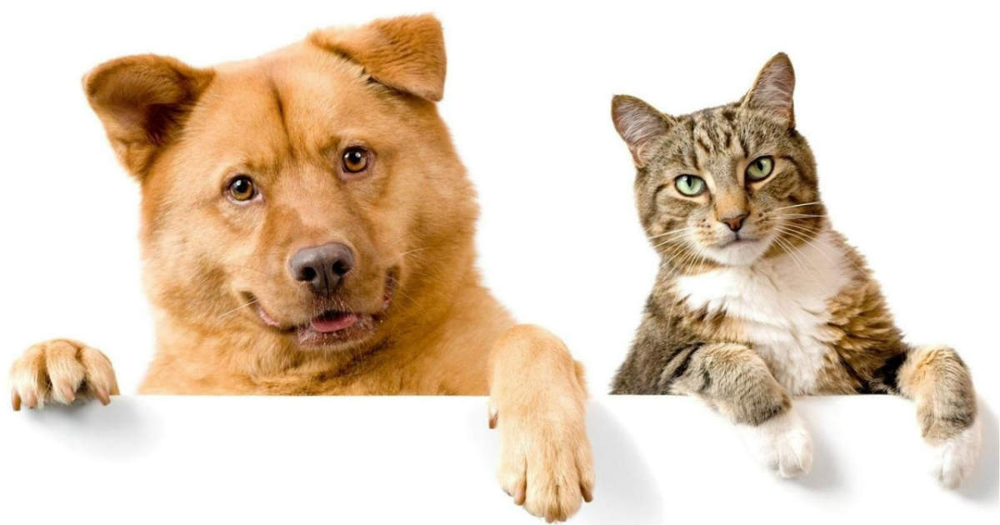

In [26]:
# 주피터 노트북에서 이미지를 보는 공식적인 코드 (1) : 길게 쓰기
import requests
from io import BytesIO
from PIL import Image

image_url = 'https://storage.googleapis.com/petbacker/images/blog/2017/dog-and-cat-cover.jpg'
response = requests.get(image_url)    
img = BytesIO(response.content)
image = Image.open(img)
image

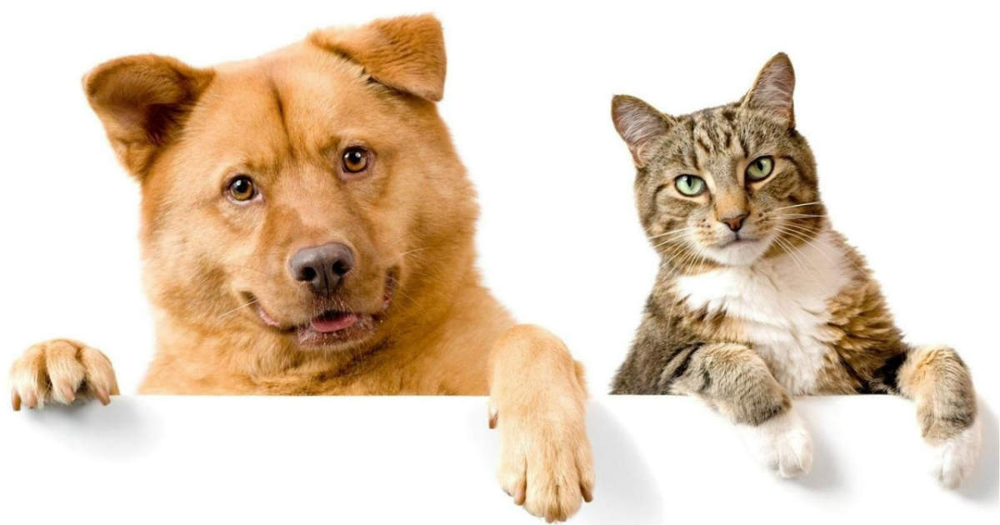

In [50]:
# 주피터 노트북에서 이미지를 보는 공식적인 코드 (2) : 축약해서 쓰기
import requests
from io import BytesIO
from PIL import Image

image_url = 'https://storage.googleapis.com/petbacker/images/blog/2017/dog-and-cat-cover.jpg'
image = Image.open(BytesIO(requests.get(image_url).content))
image

In [51]:
# 필요한 값들을 준비한다.
key = '***********************'
endpoint = 'https://***********************.cognitiveservices.azure.com/'

# 컴퓨터 비전 2.0 버전을 사용할 것이기 때문에 endpoint 뒤에 붙여준다.
endpoint += 'vision/v2.0/'

In [52]:
# endpoint로 이미지 분석과, 이미지 감지 작업을 할 수 있다.
analyze_endpoint = endpoint + 'analyze'     # 분석을 위해 끝에 detect를 붙인다.
detect_endpoint = endpoint + 'detect'       # 감지를 위해 끝에 detect를 붙인다.

In [53]:
# 웹 통신할 때는 header, parameter, data 3가지가 필요하다.
header = { 'Ocp-Apim-Subscription-Key' : key }
params = { 'visualFeatures' : 'Categories,Description,Color' }
data = { 'url' : image_url }

In [54]:
# 외부로 요청하기 (클라우드에서 분석 후, 분석값을 가져온다.)
response = requests.post(analyze_endpoint,
                         headers=header,
                         params=params,
                         json=data)

In [55]:
result = response.json()
result    # JSON으로 결과를 출력시킨다.

{'categories': [],
 'color': {'dominantColorForeground': 'White',
  'dominantColorBackground': 'White',
  'dominantColors': ['White'],
  'accentColor': '724416',
  'isBwImg': False,
  'isBWImg': False},
 'description': {'tags': ['sitting',
   'dog',
   'cat',
   'indoor',
   'mammal',
   'animal',
   'brown',
   'laying',
   'looking',
   'lying',
   'table',
   'large',
   'standing',
   'bed'],
  'captions': [{'text': 'a cat sitting next to a dog',
    'confidence': 0.8562573519887138}]},
 'requestId': 'f276f361-0316-4719-974d-3650d3177071',
 'metadata': {'height': 630, 'width': 1200, 'format': 'Jpeg'}}

> **'description': {'tags': ['sitting','dog','cat','indoor','mammal','animal','brown','laying','looking','lying','table','large','standing','bed'],**
**'captions': [{'text': 'a cat sitting next to a dog', 'confidence': 0.8562575172748902}]},**

- 카테고리, 색상(주 전경 색상, 주 배경 색상, 강조되는 색상 등), 설명(키워드, 캡션, 성공률), 이미지 정보 등의 정보를 출력한다.

---

다른 이미지를 사용해보자.

![flag with mountain](https://info.ehl.edu/hubfs/Swiss-tourism-2.jpg)

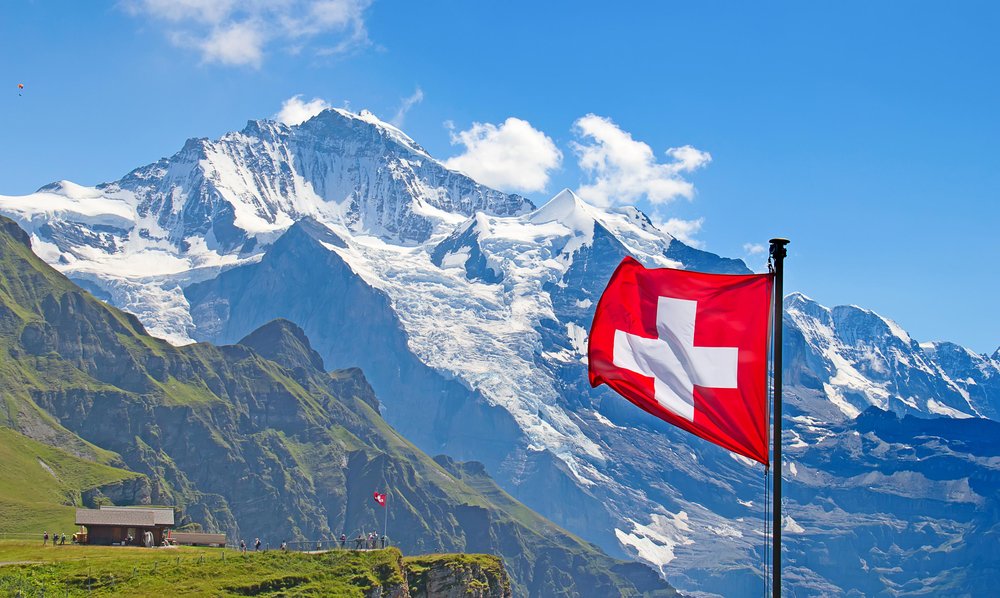

In [58]:
import requests
from io import BytesIO
from PIL import Image

image_url = 'https://info.ehl.edu/hubfs/Swiss-tourism-2.jpg'
image = Image.open(BytesIO(requests.get(image_url).content))
image

In [57]:
# 필요한 값들을 준비한다.
key = '***********************'
endpoint = 'https://***********************.cognitiveservices.azure.com/'

# 컴퓨터 비전 2.0 버전을 사용할 것이기 때문에 endpoint 뒤에 붙여준다.
endpoint += 'vision/v2.0/'

In [59]:
# endpoint로 이미지 분석과, 이미지 감지 작업을 할 수 있다.
analyze_endpoint = endpoint + 'analyze'     # 분석을 위해 끝에 detect를 붙인다.
detect_endpoint = endpoint + 'detect'       # 감지를 위해 끝에 detect를 붙인다.

In [60]:
# 웹 통신할 때는 header, parameter, data 3가지가 필요하다.
header = { 'Ocp-Apim-Subscription-Key' : key }
params = { 'visualFeatures' : 'Categories,Description,Color' }
data = { 'url' : image_url }

In [61]:
# 외부로 요청하기 (클라우드에서 분석 후, 분석값을 가져온다.)
response = requests.post(analyze_endpoint,
                         headers=header,
                         params=params,
                         json=data)

In [62]:
result = response.json()
result    # JSON으로 결과를 출력시킨다.

{'categories': [{'name': 'others_', 'score': 0.00390625},
  {'name': 'outdoor_', 'score': 0.015625, 'detail': {'landmarks': []}}],
 'color': {'dominantColorForeground': 'Red',
  'dominantColorBackground': 'Blue',
  'dominantColors': ['Blue'],
  'accentColor': 'C80323',
  'isBwImg': False,
  'isBWImg': False},
 'description': {'tags': ['mountain',
   'outdoor',
   'snow',
   'nature',
   'background',
   'view',
   'covered',
   'field',
   'hill',
   'large',
   'front',
   'standing',
   'sitting',
   'area',
   'hillside',
   'plane',
   'flying',
   'people',
   'skiing',
   'tall',
   'flag',
   'stop',
   'airplane',
   'train',
   'man',
   'air',
   'group'],
  'captions': [{'text': 'a flag with a mountain in the background',
    'confidence': 0.9821152465556965}]},
 'requestId': 'e366eed6-e09c-4698-a317-dbfda0d6ab8f',
 'metadata': {'height': 2154, 'width': 3600, 'format': 'Jpeg'}}